# EDA for Affective AI datasets

## Imports

In [ ]:
import os
import random
from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import numpy as np

from src.utils.constants import ANGLE_MAP, EMOTION_MAP

## KDEF Dataset

The dataset files are named using a specific convention that encodes information about the subject, expression, and angle of the photograph. The naming convention is as follows:

**Example:** `AF01ANFL.JPG`

*   **Letter 1: Session**
    *   `A` = series one
    *   `B` = series two
*   **Letter 2: Gender**
    *   `F` = female
    *   `M` = male
*   **Letter 3 & 4: Identity number**
    *   `01` - `35`
*   **Letter 5 & 6: Expression**
    *   `AF` = afraid
    *   `AN` = angry
    *   `DI` = disgusted
    *   `HA` = happy
    *   `NE` = neutral
    *   `SA` = sad
    *   `SU` = surprised
*   **Letter 7 & 8: Angle**
    *   `FL` = full left profile
    *   `HL` = half left profile
    *   `S` = straight
    *   `HR` = half right profile
    *   `FR` = full right profile
*   **Extension: Picture format**
    *   `JPG` = jpeg (Joint Photographic Experts Group)

### Dataset Statistics

*   **Participants:** 70 (35 males and 35 females).
*   **Age:** m 25 years, ranging from 20 to 30 years.
*   **Expressions:** 7 (neutral, happy, angry, afraid, disgusted, sad, surprised).
*   **Angles:** 5 (full left profile, half left profile, straight, half right profile, full right profile).
*   **Sessions:** 2.
*   **Number of pictures:** 4900.
*   **Size:** 562 * 762 pixels.
*   **Resolution:** 72*72 dpi.
*   **Colors:** 16.7 million (32 bit).
*   **Size inflated:** 1.6 Mb.
*   **Size compressed:** approximately 122 kb (ranging from 85 to 158 kb).
*   **File format:** JPEG.
*   **Compression quality:** 94 %.

In [2]:
KDEF_PATH = Path("data/raw")
KDEF_GRAYSCALE_PATH = Path("data/grayscale")
KDEF_DEGRADED_PATH = Path("data/degraded")

### Check if files are valid:

For each directory (person) check:
- If every person has the same number of images (35)

    For each image check:
    - If it's JPG
    - If it starts with the directory name
    - If the emotion code is valid
    - If the angle code is valid
    - If every image is of size 562x762
    - If is RGB

- Count number of images per emotion and angle, they should be 7 and 5 respectively

Failures:

- 2 instances failed on wrong naming convention: "AF31V.JPG", "AM31H.JPG" **(fix: renamed)**

- 2 instance failed on image size: "AM05ANFR.JPG", "BM10ANFR.JPG" - size 970 x 633 **(fix: manually cropped)**

- 10 instances failed on image being mostly black (mean pixel value < 10): 
    -   "AF01SUFR.JPG", "AF10AFFR.JPG", "AF11NEHL.JPG", "AF20DIHL.JPG", "AM25DIFL.JPG", "AM34DIFR.JPG", "BF13NEHR.JPG", "BM21DIFL.JPG", "BM22DIHL.JPG", "BM24DIFL.JPG" **(fix: TODO)**

In [3]:
directories = os.listdir(KDEF_PATH)[1:]  # skip .gitkeep

In [36]:
errors_found = []

for dir_name in directories:
    dir_path = KDEF_PATH / dir_name
    files = os.listdir(dir_path)

    if len(files) != 35:
        msg = f"[DIR WARNING] Folder {dir_name} has {len(files)} files (expected 35)."
        print(msg)
        errors_found.append(msg)

    emotions_count = {key: 0 for key in EMOTION_MAP.keys()}
    angles_count = {key: 0 for key in ANGLE_MAP.keys()}

    for img_path in files:
        if not img_path.lower().endswith(".jpg"):
            print(f"  [SKIP] File {img_path} is not a JPG image. Skipping.")
            continue
        if not img_path.startswith(dir_name):
            print(
                f"  [NAME ERROR] File {img_path} in folder {dir_name} has a wrong name."
            )
            errors_found.append(f"{dir_name}/{img_path}: Wrong prefix")
        if len(img_path) < 8:
            print(f"  [NAME ERROR] Filename {img_path} is too short to parse.")
            continue

        emo_code = img_path[4:6]
        angle_code = img_path[6:8]
        if emo_code not in EMOTION_MAP:
            print(f"  [CODE ERROR] {img_path}: Unknown emotion code '{emo_code}'.")
        else:
            emotions_count[emo_code] += 1
        if angle_code not in ANGLE_MAP:
            print(f"  [CODE ERROR] {img_path}: Unknown angle code '{angle_code}'.")
        else:
            angles_count[angle_code] += 1

        full_path = str(dir_path / img_path)
        image = cv2.imread(full_path, cv2.IMREAD_COLOR)
        if image is None:
            print(f"  [READ ERROR] Failed to load {img_path}.")
            errors_found.append(f"{img_path}: Read error")
            continue
        if image.shape != (762, 562, 3):
            print(
                f"  [SHAPE WARNING] {img_path} has shape {image.shape}, expected (762, 562, 3)."
            )

        if np.mean(image) <= 10:  # type: ignore
            print(f"  [CONTENT ERROR] {img_path} is too dark/empty.")

    for key, count in emotions_count.items():
        if count != 5:
            print(
                f"  [DIST ERROR] {dir_name}: Emotion {key} appears {count} times (expected 5)."
            )
    for key, count in angles_count.items():
        if count != 7:
            print(
                f"  [DIST ERROR] {dir_name}: Angle {key} appears {count} times (expected 7)."
            )

  [CONTENT ERROR] AF01SUFR.JPG is too dark/empty.
  [CONTENT ERROR] AF10AFFR.JPG is too dark/empty.
  [CONTENT ERROR] AF11NEHL.JPG is too dark/empty.
  [CONTENT ERROR] AF20DIHL.JPG is too dark/empty.
  [CONTENT ERROR] AM25DIFL.JPG is too dark/empty.
  [CONTENT ERROR] AM34DIFR.JPG is too dark/empty.
  [CONTENT ERROR] BF13NEHR.JPG is too dark/empty.
  [CONTENT ERROR] BM21DIFL.JPG is too dark/empty.
  [CONTENT ERROR] BM22DIHL.JPG is too dark/empty.
  [CONTENT ERROR] BM24DIFL.JPG is too dark/empty.


In [8]:
person_id = "AF01"
person_path = KDEF_PATH / person_id
img_order = [0, 2, 4, 3, 1]

### Example of single person for the same expression with different angles:

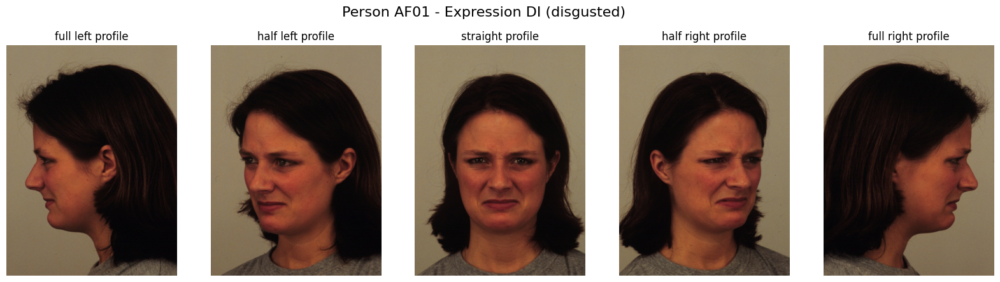

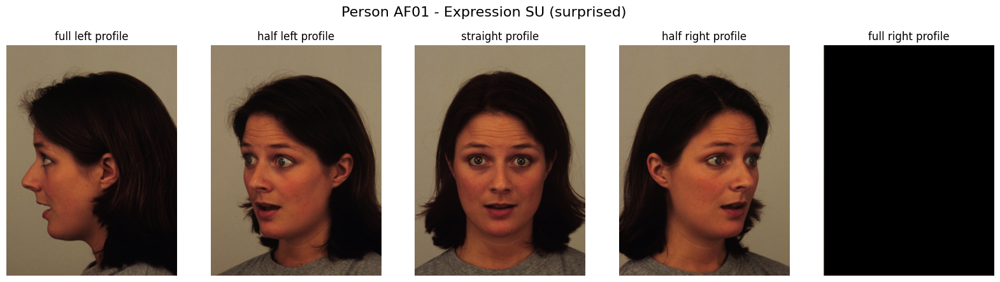

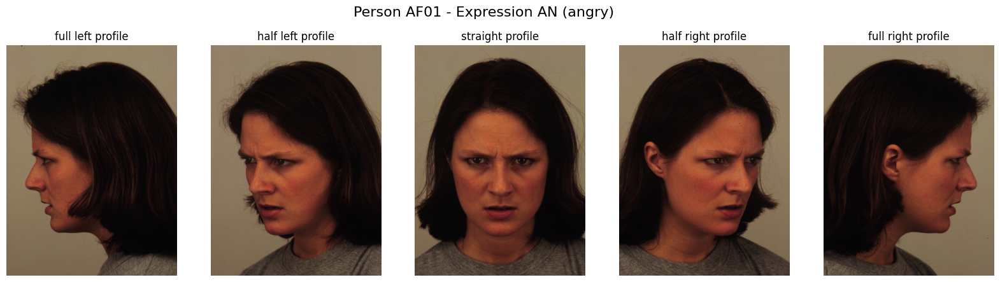

In [63]:
random_emotions = random.sample(list(EMOTION_MAP.keys()), 3)

for expression in random_emotions:
    current_files = sorted(
        [f for f in os.listdir(person_path) if f.startswith(f"{person_id}{expression}")]
    )

    ordered_files = [current_files[i] for i in img_order]

    fig, axs = plt.subplots(1, len(ordered_files), figsize=(20, 5))
    fig.suptitle(
        f"Person {person_id} - Expression {expression} ({EMOTION_MAP[expression]})",
        fontsize=16,
    )

    for i in range(len(ordered_files)):
        img_path = str(person_path / ordered_files[i])
        img_path = cv2.imread(img_path, cv2.IMREAD_COLOR_RGB)

        axs[i].imshow(img_path)
        axs[i].axis("off")
        axs[i].set_title(ANGLE_MAP[ordered_files[i][6:8]])
    plt.show()

### Example of how different people show emotions:

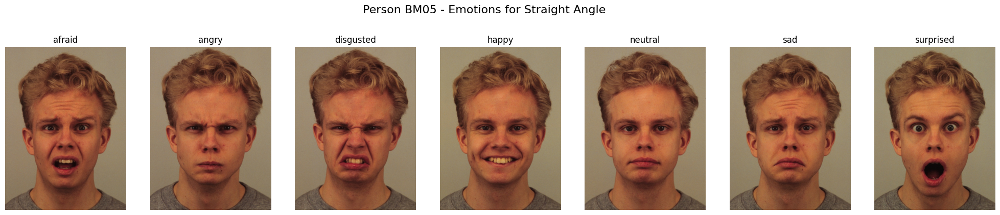

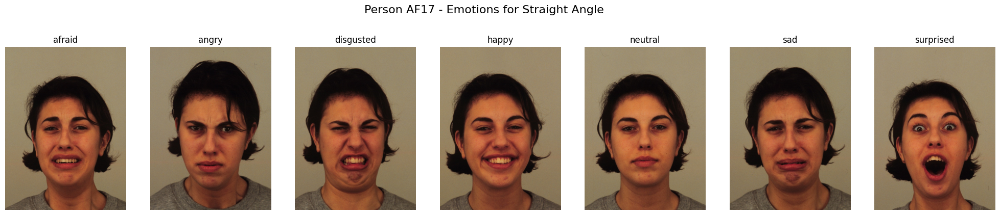

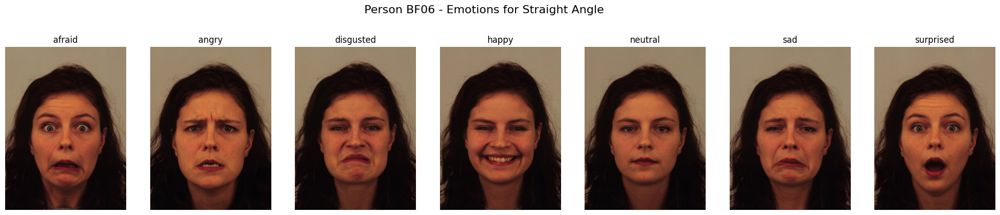

In [ ]:
people = os.listdir(KDEF_PATH)
random_people = random.sample(people, 3)
for person_id in random_people:
    person_path = KDEF_PATH / person_id
    image_files = [f for f in os.listdir(person_path) if f.endswith("S.JPG")]
    fig, axs = plt.subplots(1, len(image_files), figsize=(25, 5))
    fig.suptitle(f"Person {person_id} - Emotions for Straight Angle", fontsize=16)

    for i in range(len(image_files)):
        img_path = cv2.imread(str(person_path / image_files[i]), cv2.IMREAD_COLOR_RGB)
        axs[i].imshow(img_path)
        axs[i].axis("off")
        axs[i].set_title(EMOTION_MAP[image_files[i][4:6]])

    plt.show()

### Original vs Grayscaled vs Degraded

In [66]:
def visualize_domain_impact(num_samples=3, zoom_mode=False):
    all_straight_images = list(KDEF_PATH.rglob("*S.JPG"))

    selected_files = random.sample(all_straight_images, num_samples)

    _, axes = plt.subplots(
        len(selected_files), 3, figsize=(15, 5 * len(selected_files))
    )

    cols = ["Oryginał (Raw)", "Grayscale", "Degraded (Noise/Blur)"]

    for row_idx, file_path in enumerate(selected_files):
        relative_path = file_path.relative_to(KDEF_PATH)

        path_raw = file_path
        path_gray = KDEF_GRAYSCALE_PATH / relative_path
        path_deg = KDEF_DEGRADED_PATH / relative_path

        paths = [path_raw, path_gray, path_deg]

        for col_idx, p in enumerate(paths):
            ax = axes[row_idx][col_idx]

            img = cv2.imread(str(p))

            if img is not None:
                if len(img.shape) == 2:
                    img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
                else:
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                if zoom_mode:
                    h, w, _ = img.shape
                    center_y, center_x = h // 2, w // 2
                    zoom_size = 120
                    img = img[
                        center_y - zoom_size : center_y + zoom_size,
                        center_x - zoom_size : center_x + zoom_size,
                    ]
                ax.imshow(img)

            if row_idx == 0:
                ax.set_title(cols[col_idx], fontsize=14)

            if col_idx == 0:
                fname = p.name
                ax.set_ylabel(
                    f"{fname}\n(Zoom)" if zoom_mode else fname,
                    rotation=90,
                    size="large",
                )

            ax.axis("off")

    plt.tight_layout()
    plt.show()

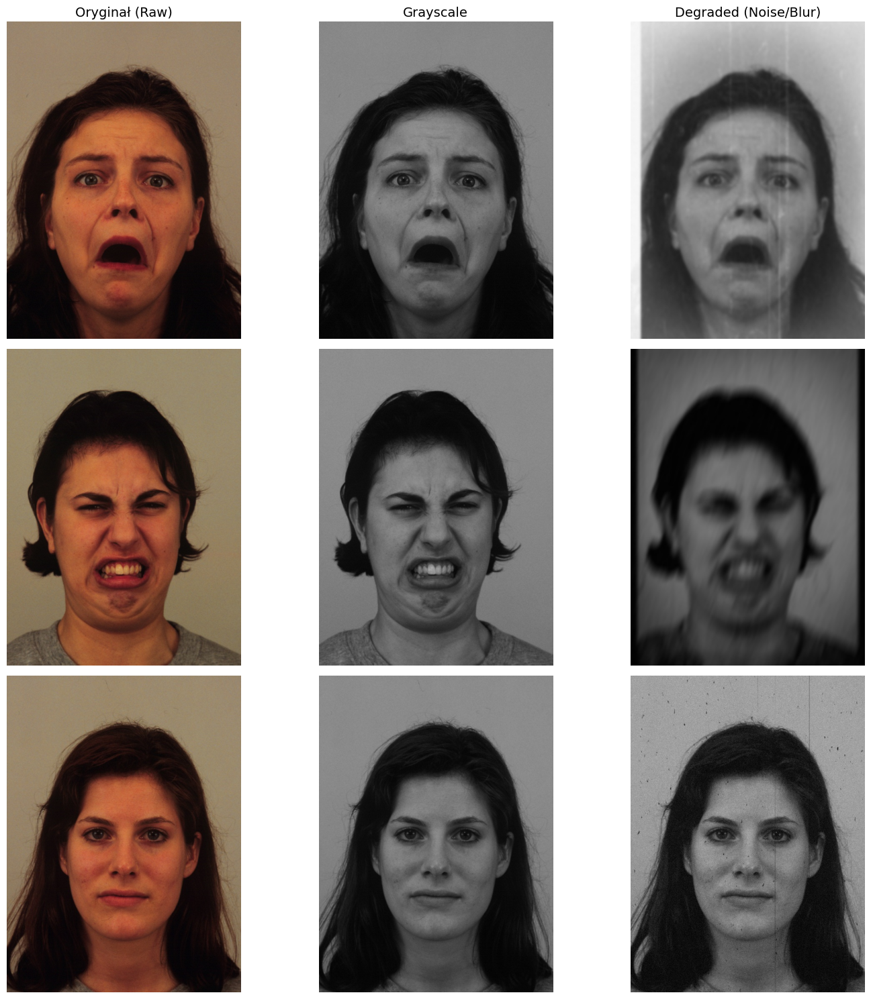

In [77]:
visualize_domain_impact(num_samples=3, zoom_mode=False)

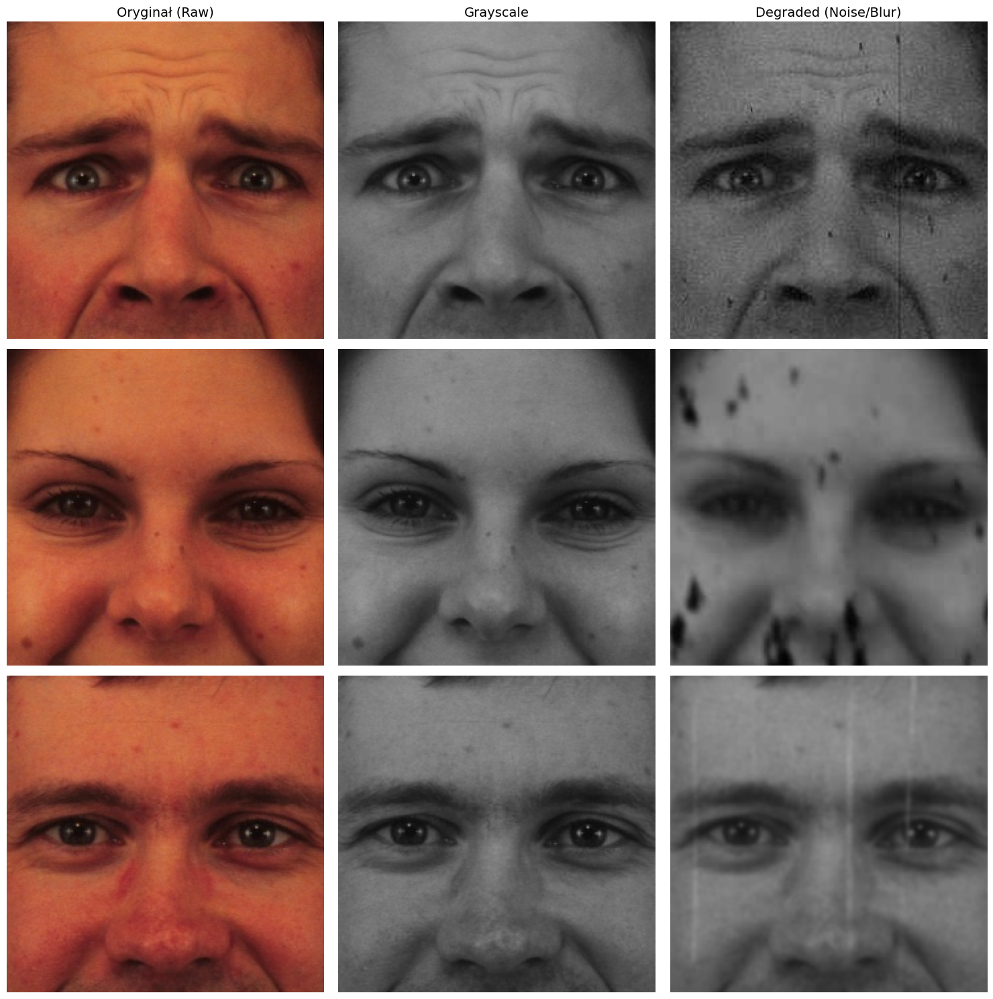

In [97]:
visualize_domain_impact(num_samples=3, zoom_mode=True)

### Histogram analysis

In [4]:
def analyze_histograms_from_disk(relative_file_path):
    path_raw = KDEF_PATH / relative_file_path
    path_gray = KDEF_GRAYSCALE_PATH / relative_file_path
    path_deg = KDEF_DEGRADED_PATH / relative_file_path

    paths = [path_raw, path_gray, path_deg]
    titles = ["Original (RGB)", "Grayscale", "Degraded"]

    _, axes = plt.subplots(2, 3, figsize=(18, 10))

    loaded_images = []

    for col_idx, p in enumerate(paths):
        ax_img = axes[0][col_idx]
        img_bgr = cv2.imread(str(p))
        if img_bgr is None:
            ax_img.text(0.5, 0.5, "Read error", ha="center")
            loaded_images.append(None)
            continue

        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        loaded_images.append(img_bgr)

        ax_img.imshow(img_rgb)
        ax_img.set_title(titles[col_idx], fontsize=14)
        ax_img.axis("off")

    for col_idx, img_bgr in enumerate(loaded_images):
        ax_hist = axes[1][col_idx]

        is_grayscale_folder = col_idx == 1

        if not is_grayscale_folder:
            colors = ("b", "g", "r")
            for i, color in enumerate(colors):
                hist = cv2.calcHist([img_bgr], [i], None, [256], [0, 256])
                ax_hist.plot(hist, color=color, alpha=0.8, linewidth=1.5)
            ax_hist.set_title("RGB Histogram")

        else:
            img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
            hist = cv2.calcHist([img_gray], [0], None, [256], [0, 256])

            ax_hist.plot(hist, color="black", linewidth=1.5)
            ax_hist.fill_between(range(256), hist.ravel(), color="gray", alpha=0.3)
            ax_hist.set_title("Brightness Histogram")

        ax_hist.set_xlim([0, 256])
        ax_hist.set_xlabel("Pixel Value")
        if col_idx == 0:
            ax_hist.set_ylabel("Pixel Count")
        ax_hist.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

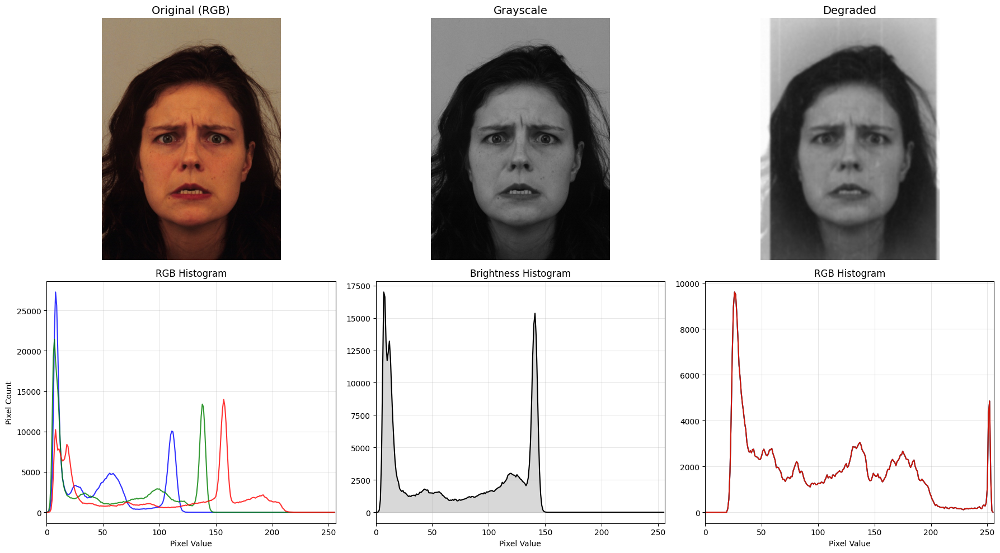

In [10]:
file_relative = "AF06/AF06ANS.JPG"
analyze_histograms_from_disk(file_relative)

### Average emotion images:

In [29]:
emotions = EMOTION_MAP.keys()
emotion_images = {emo: [] for emo in emotions}

for person_id in directories:
    for img_path in os.listdir(KDEF_PATH / person_id):
        if img_path.endswith("S.JPG"):
            emotion_code = img_path[4:6]
            img = cv2.imread(
                str(KDEF_PATH / person_id / img_path), cv2.IMREAD_COLOR_RGB
            )
            emotion_images[emotion_code].append(img)

In [35]:
emotion_average_faces = {}

for emotion in emotion_images.keys():
    emotion_average_faces[emotion] = np.mean(emotion_images[emotion], axis=0).astype(
        np.uint8
    )

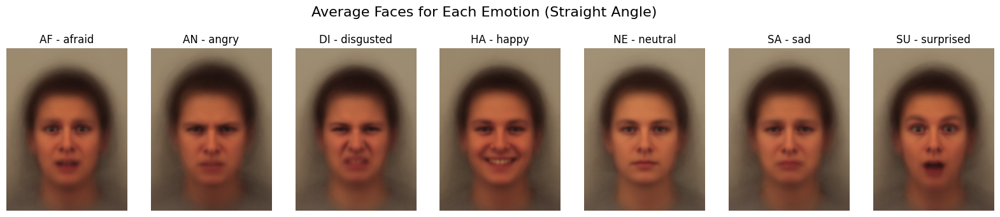

In [37]:
fig, axes = plt.subplots(1, len(emotion_average_faces), figsize=(20, 4))

for ax, emo in zip(axes, emotion_average_faces.keys()):
    ax.imshow(emotion_average_faces[emo])
    ax.axis("off")
    ax.set_title(f"{emo} - {EMOTION_MAP[emo]}")

plt.suptitle("Average Faces for Each Emotion (Straight Angle)", fontsize=16)
plt.show()